In [1]:
import mne
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import nibabel as nib
from matplotlib.pyplot import figure
from matplotlib import patches

import nilearn
from nilearn.datasets import fetch_spm_auditory
from nilearn import image
from nilearn import masking
from nilearn import plotting
import pandas as pd

from os.path import join as opj
import json
# from nipype.interfaces.spm import Level1Design, EstimateModel, EstimateContrast, Normalize12
#tpm_img ='/home/ubuntu/Documents/MATLAB/spm12/tpm/TPM.nii' # normalization template

# from nipype.algorithms.modelgen import SpecifySPMModel
# from nipype.interfaces.utility import Function, IdentityInterface
# from nipype.interfaces.io import SelectFiles, DataSink
# from nipype import Workflow, Node
# #from bids.layout import BIDSLayout
# from nipype.algorithms.misc import Gunzip

import numpy as np
from matplotlib import pyplot as plt
from scipy.io import loadmat
from nilearn.glm.first_level import make_first_level_design_matrix
from nilearn.plotting import plot_design_matrix
from nilearn.glm.first_level import FirstLevelModel

from nilearn.reporting import get_clusters_table
from nilearn import maskers

from matplotlib import pyplot as plt

from nilearn.reporting import get_clusters_table
from nilearn import maskers
from nilearn import input_data



C:\Users\vctrf\Anaconda3\envs\mne\lib\site-packages\nilearn\input_data\__init__.py:27: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [2]:
def Act_Rrest (data_folder,subject_code,events_,fildd):
    for i in  subject_code:
        subject_folder='/sub-xp'
        String_contrinuation1='/func/sub-xp'
        String_contrinuation2=fildd
        subject_codee=str(i)
    
        subject_data=data_folder+subject_folder+subject_codee+String_contrinuation1+subject_codee+String_contrinuation2
        
        fmri_img = nib.load(subject_data)
        mean_img = image.mean_img(fmri_img) #media de los time points
        mask = masking.compute_epi_mask(mean_img)
        fmri_img = image.clean_img(fmri_img, standardize=False)
        fmri_img = image.smooth_img(fmri_img, 5.)
        
        if i == subject_code[0]:
            del events_['stim_file']
            events=events_.replace({'Task-NF':'Task'})
            print(events)
        
        tr = 2  # repetition time of MRI scans is 5 seconds
        n_scans = fmri_img.shape[3]  # the acquisition comprises 210 scans
        frame_times = np.arange(n_scans) * tr  # here are the correspoding frame times
        
        hrf_model = 'spm'
        X1 = make_first_level_design_matrix(frame_times, events, drift_model= "Cosine",
                                    hrf_model=hrf_model)
        
        fmri_glm = FirstLevelModel(signal_scaling=False, mask_img=mask, minimize_memory=False)
        fmri_glm = fmri_glm.fit(fmri_img, design_matrices=X1)
        
        z_map = fmri_glm.compute_contrast('Task- Rest') # els rois son els punts que mes canvien en el temps comparant task amb el rest
        
        
        plotting.plot_stat_map(z_map, bg_img=mean_img, threshold=3.1, title=subject_codee)
        
        
        
        table = get_clusters_table(z_map, stat_threshold=3.1,
                           cluster_threshold=20).set_index('Cluster ID', drop=True)
        

        # get the 4 largest clusters' max x, y, and z coordinates
        coords = table.loc[range(1,5), ['X', 'Y', 'Z']].values
        

        # extract time series from each coordinate
        masker = input_data.NiftiSpheresMasker(coords)
        real_timeseries = masker.fit_transform(fmri_img)
        # The predicted time series was also extracted with GLM, it is useful to assess the quality of the model fit.
        predicted_timeseries = masker.fit_transform(fmri_glm.predicted[0])

        
        # colors for each of the clusters
        colors = ['blue', 'navy', 'purple', 'magenta']
        # plot the time series and corresponding locations
        fig1, axs1 = plt.subplots(2, 4)
        for i in range(0, 4):
            # plotting time series
            axs1[0, i].set_title('Cluster peak {}\n'.format(coords[i]))
            axs1[0, i].plot(real_timeseries[:, i], c=colors[i], lw=2)
            axs1[0, i].plot(predicted_timeseries[:, i], c='r', ls='--', lw=2)
            axs1[0, i].set_xlabel('Time')
            axs1[0, i].set_ylabel('Signal intensity', labelpad=0)
            
            # plotting image below the time series
            roi_img = plotting.plot_stat_map(
                z_map, cut_coords=[coords[i][2]], threshold=3.1, figure=fig1,
                axes=axs1[1, i], display_mode='z', colorbar=False, bg_img=mean_img)
            roi_img.add_markers([coords[i]], colors[i], 300)
        fig1.set_size_inches(24, 14)

# EEG y fMRI

    onset  duration trial_type
0       2        20       Rest
1      22        20       Task
2      42        20       Rest
3      62        20       Task
4      82        20       Rest
5     102        20       Task
6     122        20       Rest
7     142        20       Task
8     162        20       Rest
9     182        20       Task
10    202        20       Rest
11    222        20       Task
12    242        20       Rest
13    262        20       Task
14    282        20       Rest
15    302        20       Task
16    322        20       Rest
17    342        20       Task
18    362        20       Rest
19    382        20       Task


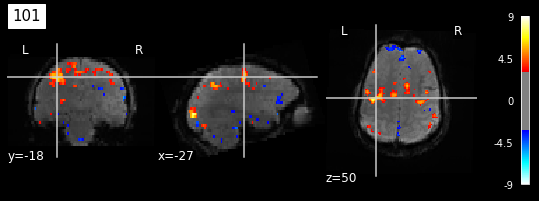

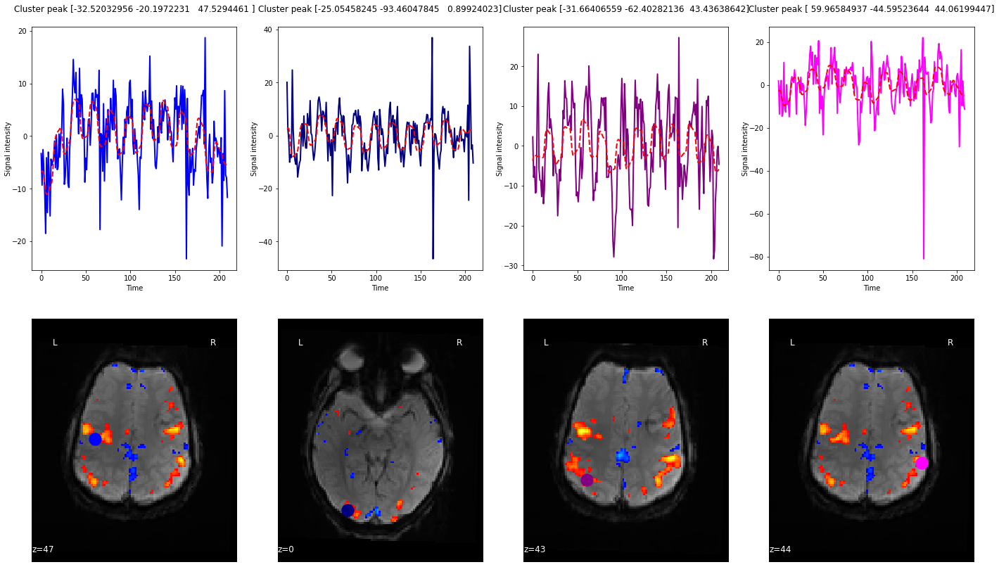

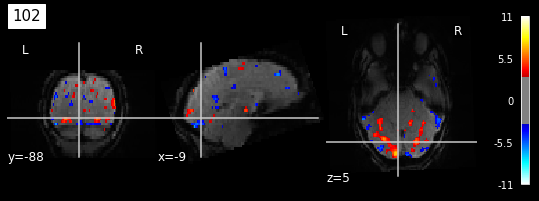

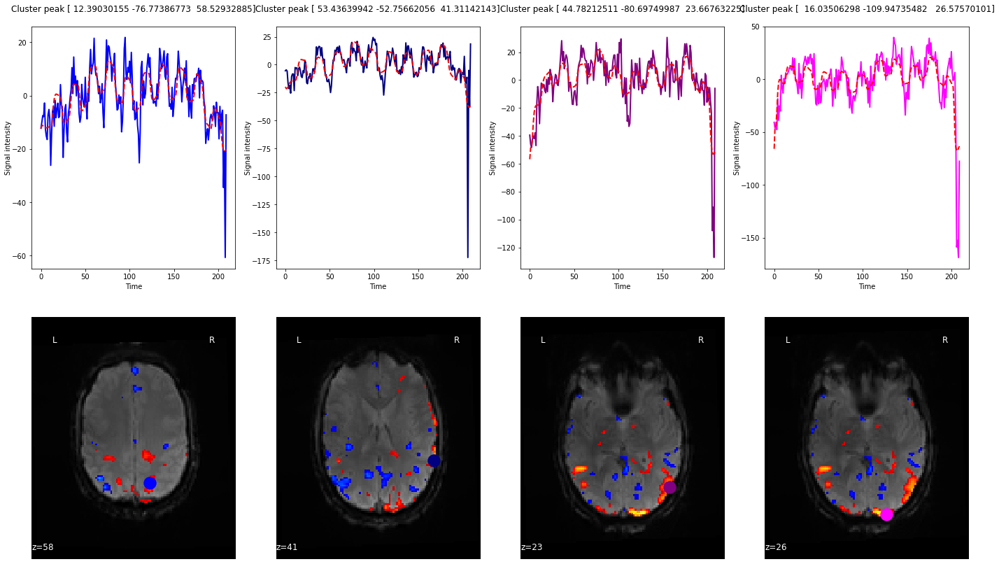

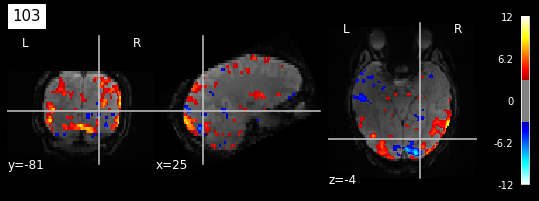

...

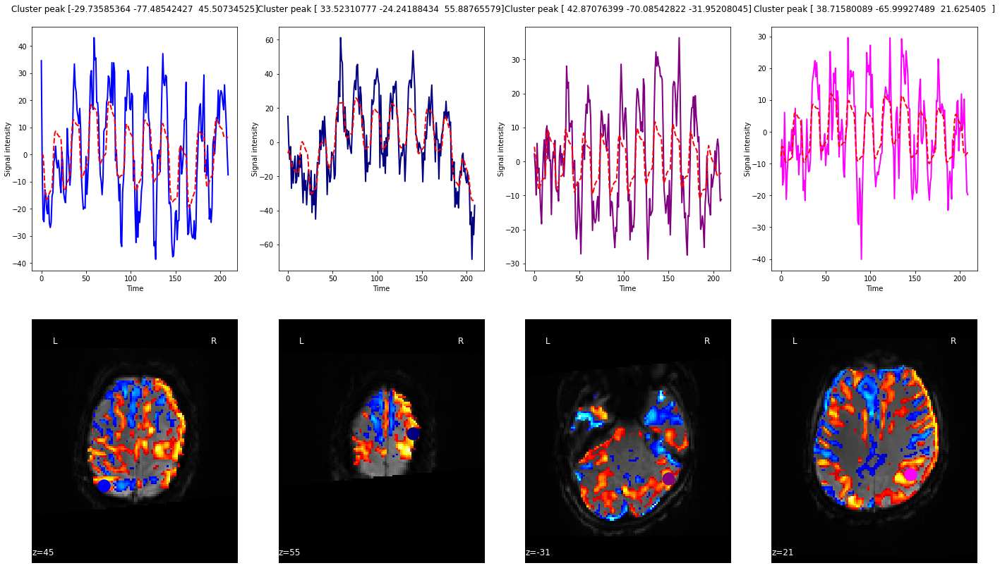

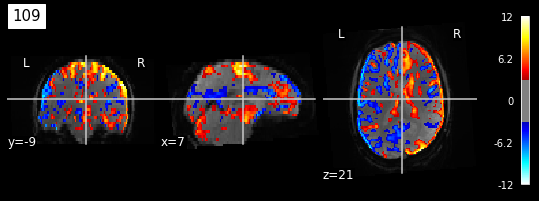

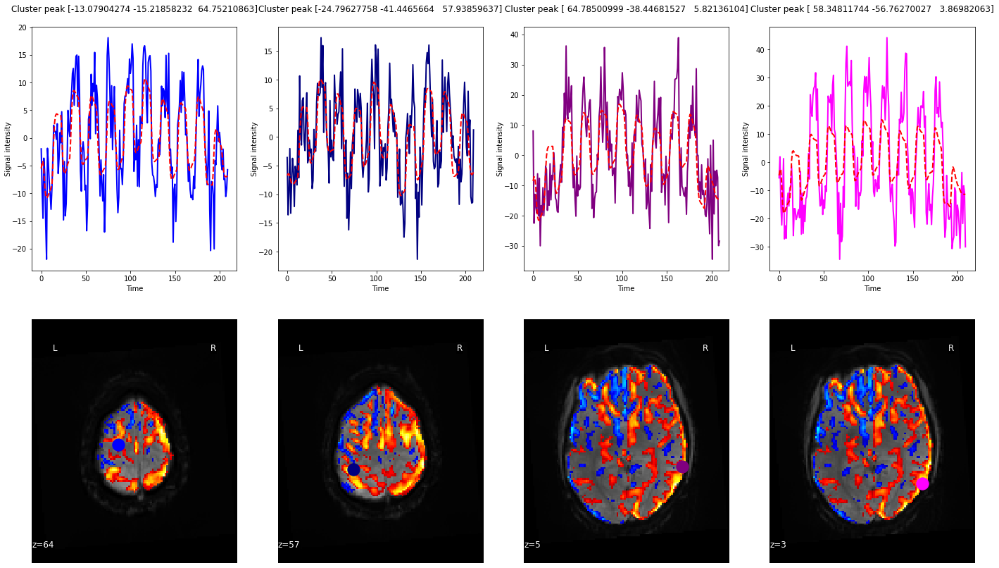

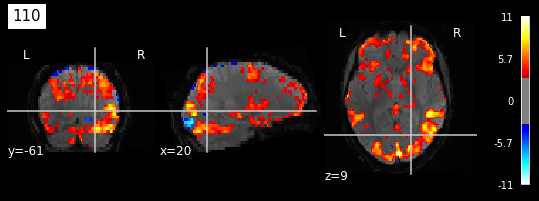

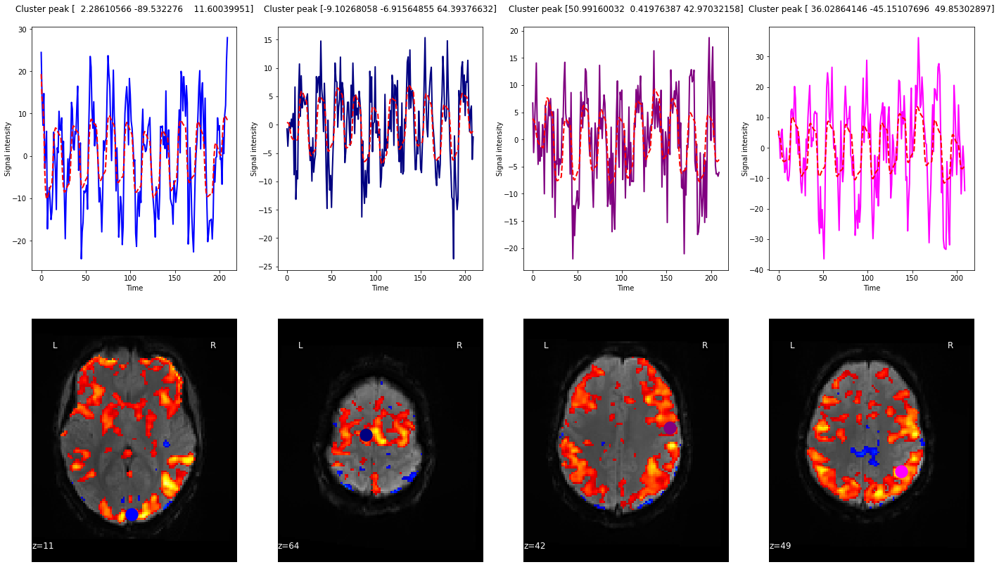

In [3]:
#data_folder = '/Users/juliagarciacornet/Desktop/Q4/Neuroimatge/project'
data_folder = 'C:/Users/vctrf/Documents/Quatrimestre_2/Neuroimagen/proyecto Neuroimagen'
fild_to_study='_task-eegfmriNF_bold.nii.gz'
subject_code=[101,102,103,104,105,106,107,108,109,110]
#events_ = pd.read_table('/Users/juliagarciacornet/Desktop/Q4/Neuroimatge/project/task-eegfmriNF_events.tsv')
events_ = pd.read_table('C:/Users/vctrf/Documents/Quatrimestre_2/Neuroimagen/proyecto Neuroimagen/task-eegfmriNF_events.tsv')

Act_Rrest (data_folder,subject_code,events_,fild_to_study)

# fMRI

    onset  duration trial_type
0     2.0      20.0       Rest
1    22.0      20.0       Task
2    42.0      20.0       Rest
3    62.0      20.0       Task
4    82.0      20.0       Rest
5   102.0      20.0       Task
6   122.0      20.0       Rest
7   142.0      20.0       Task
8   162.0      20.0       Rest
9   182.0      20.0       Task
10  202.0      20.0       Rest
11  222.0      20.0       Task
12  242.0      20.0       Rest
13  262.0      20.0       Task
14  282.0      20.0       Rest
15  302.0      20.0       Task
16  322.0      20.0       Rest
17  342.0      20.0       Task
18  362.0      20.0       Rest
19  382.0      20.0       Task
20    NaN       NaN        NaN


C:\Users\vctrf\Anaconda3\envs\mne\lib\site-packages\nilearn\glm\first_level\experimental_paradigm.py:117: UserWarning: Duplicated events were detected. Amplitudes of these events will be summed. You might want to verify your inputs.
  warnings.warn("Duplicated events were detected. "
C:\Users\vctrf\Anaconda3\envs\mne\lib\site-packages\nilearn\glm\first_level\experimental_paradigm.py:117: UserWarning: Duplicated events were detected. Amplitudes of these events will be summed. You might want to verify your inputs.
  warnings.warn("Duplicated events were detected. "
C:\Users\vctrf\Anaconda3\envs\mne\lib\site-packages\nilearn\glm\first_level\experimental_paradigm.py:117: UserWarning: Duplicated events were detected. Amplitudes of these events will be summed. You might want to verify your inputs.
  warnings.warn("Duplicated events were detected. "
C:\Users\vctrf\Anaconda3\envs\mne\lib\site-packages\nilearn\glm\first_level\experimental_paradigm.py:117: UserWarning: Duplicated events were det

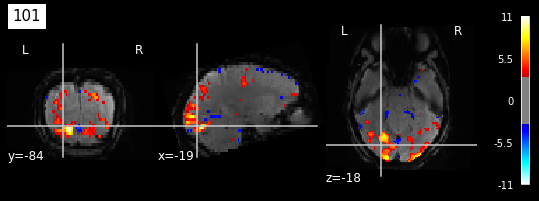

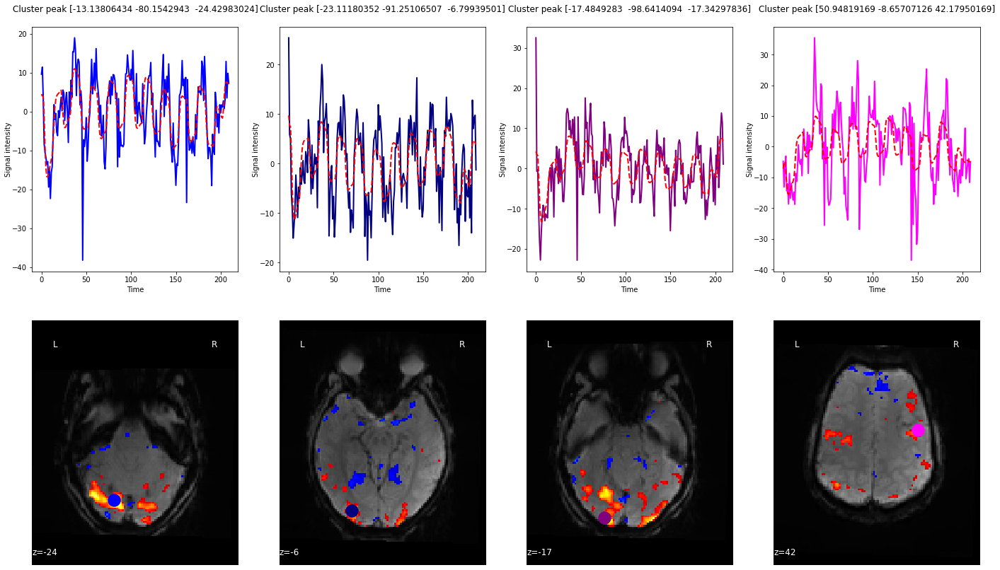

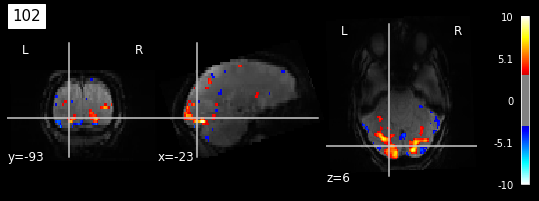

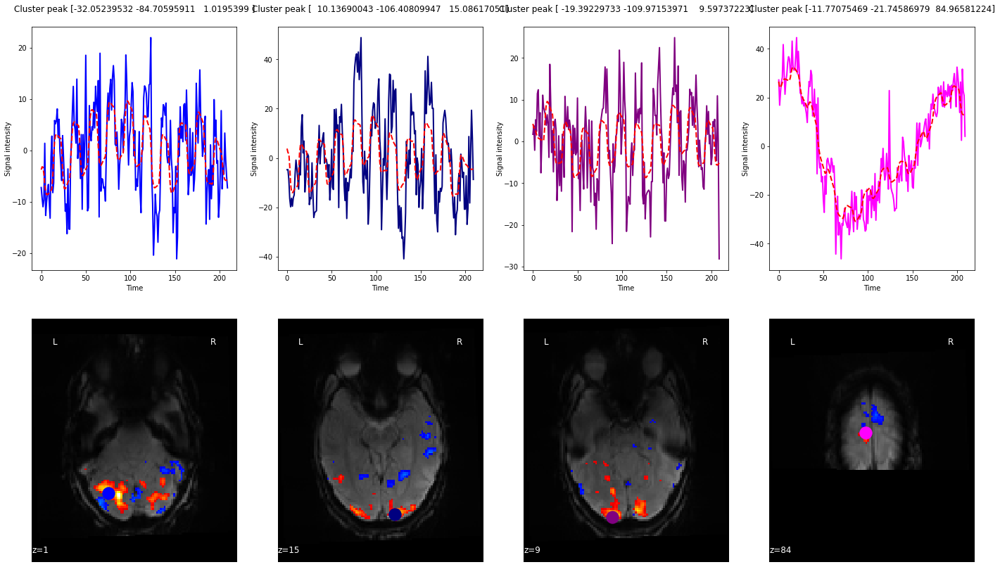

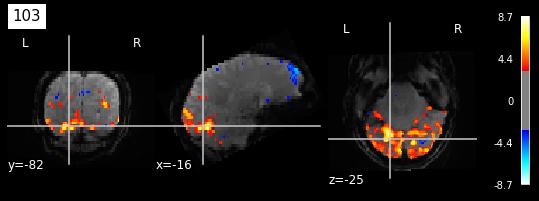

...

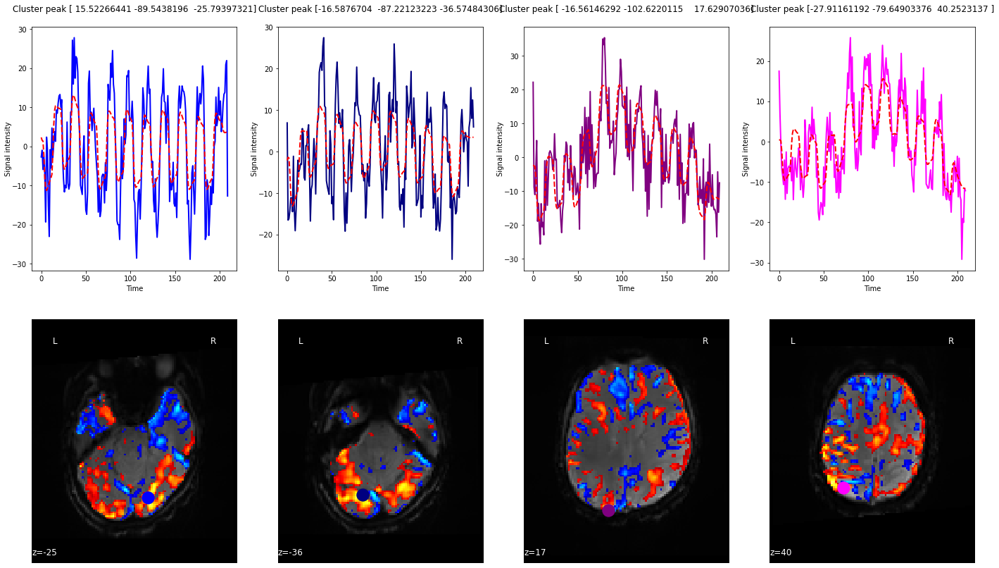

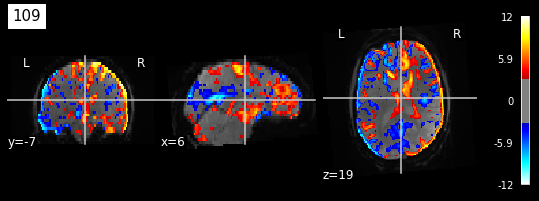

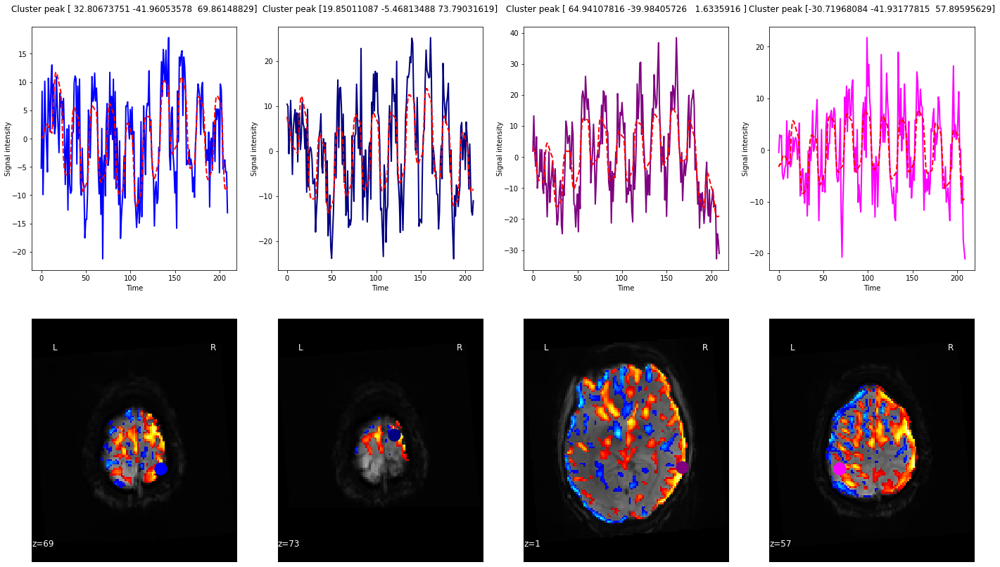

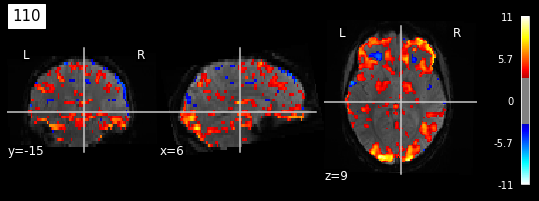

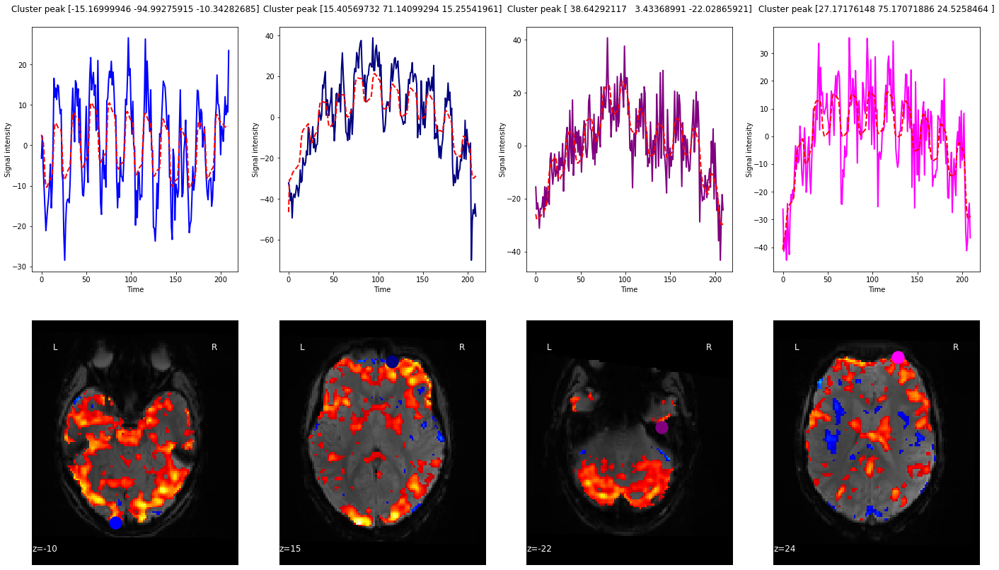

In [15]:
#data_folder = '/Users/juliagarciacornet/Desktop/Q4/Neuroimatge/project'
data_folder = 'C:/Users/vctrf/Documents/Quatrimestre_2/Neuroimagen/proyecto Neuroimagen'
fild_to_study='_task-fmriNF_bold.nii.gz'
subject_code=[101,102,103,104,105,106,107,108,109,110]
#events_ = pd.read_table('/Users/juliagarciacornet/Desktop/Q4/Neuroimatge/project/task-fmriNF_events.tsv')
events_ = pd.read_table('C:/Users/vctrf/Documents/Quatrimestre_2/Neuroimagen/proyecto Neuroimagen/task-fmriNF_events.tsv')

Act_Rrest (data_folder,subject_code,events_,fild_to_study)

# Motor loc

    onset  duration trial_type
0       2        20       Rest
1      22        20       Task
2      42        20       Rest
3      62        20       Task
4      82        20       Rest
5     102        20       Task
6     122        20       Rest
7     142        20       Task
8     162        20       Rest
9     182        20       Task
10    202        20       Rest
11    222        20       Task
12    242        20       Rest
13    262        20       Task
14    282        20       Rest
15    302        20       Task


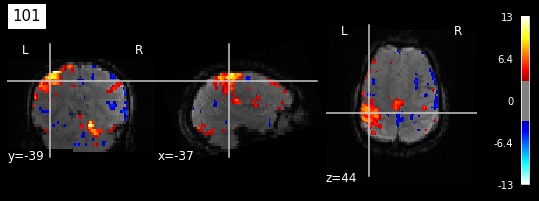

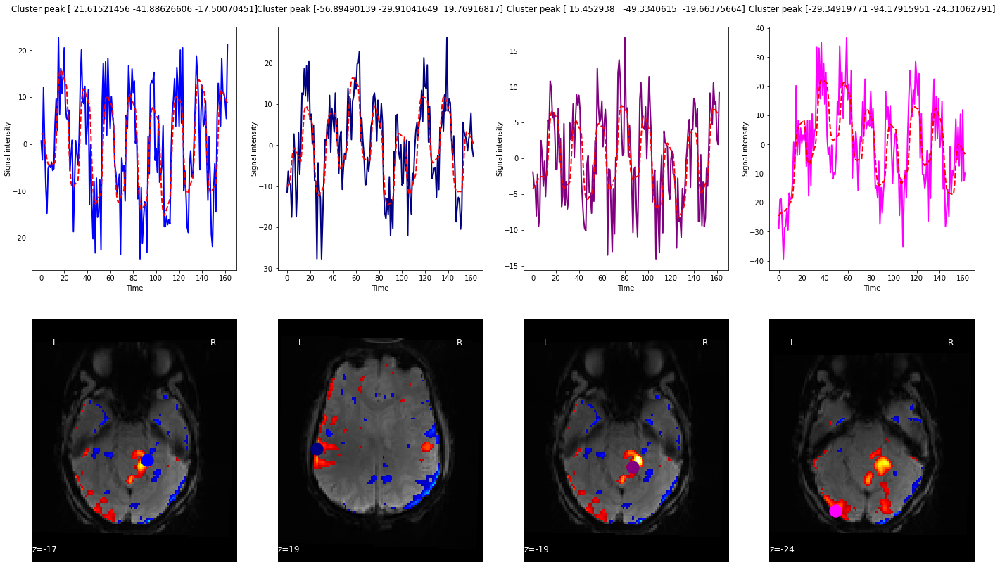

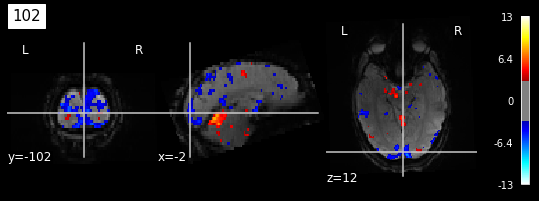

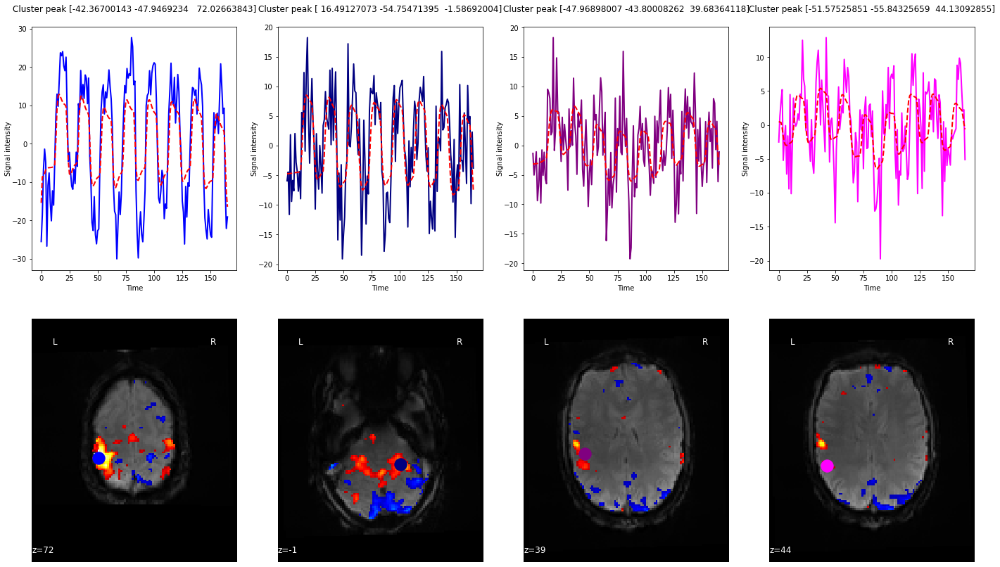

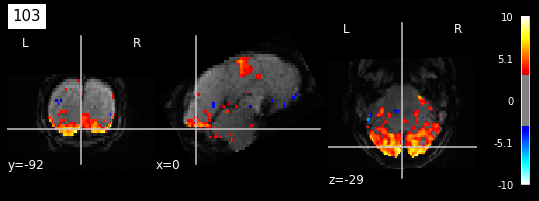

...

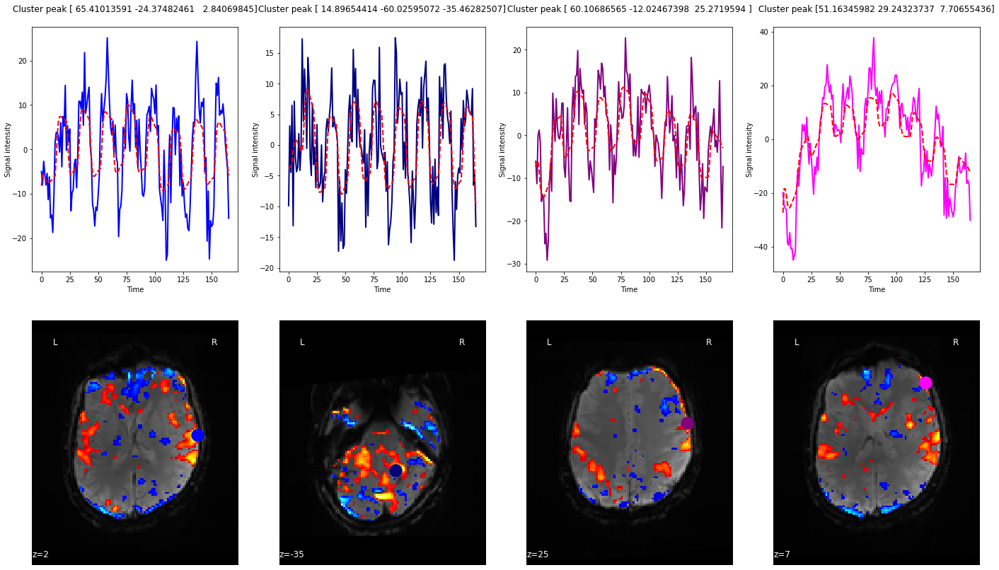

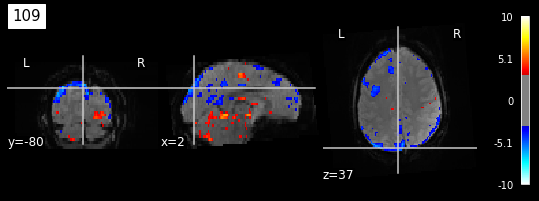

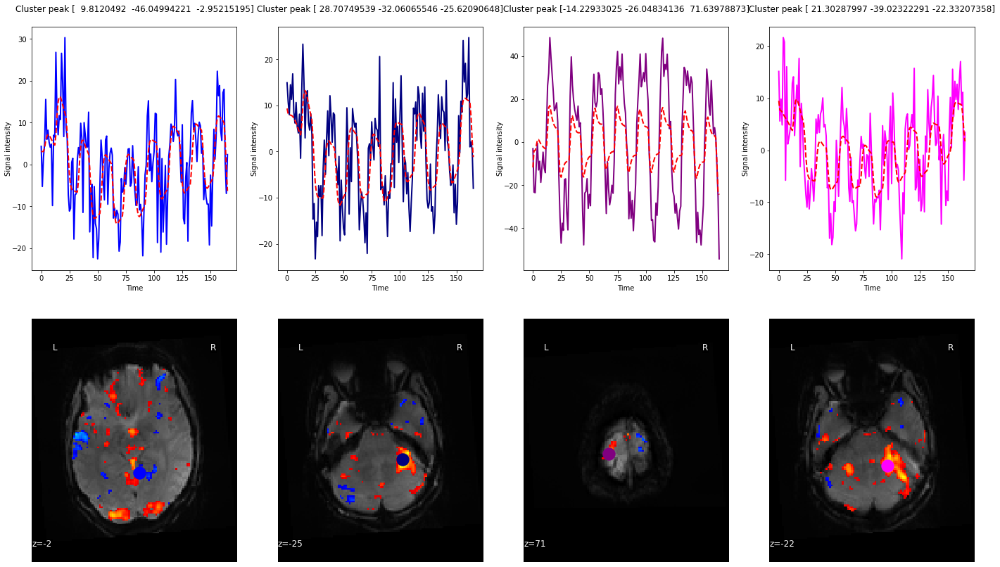

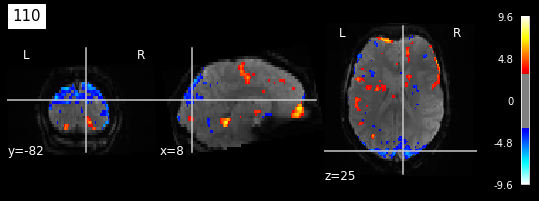

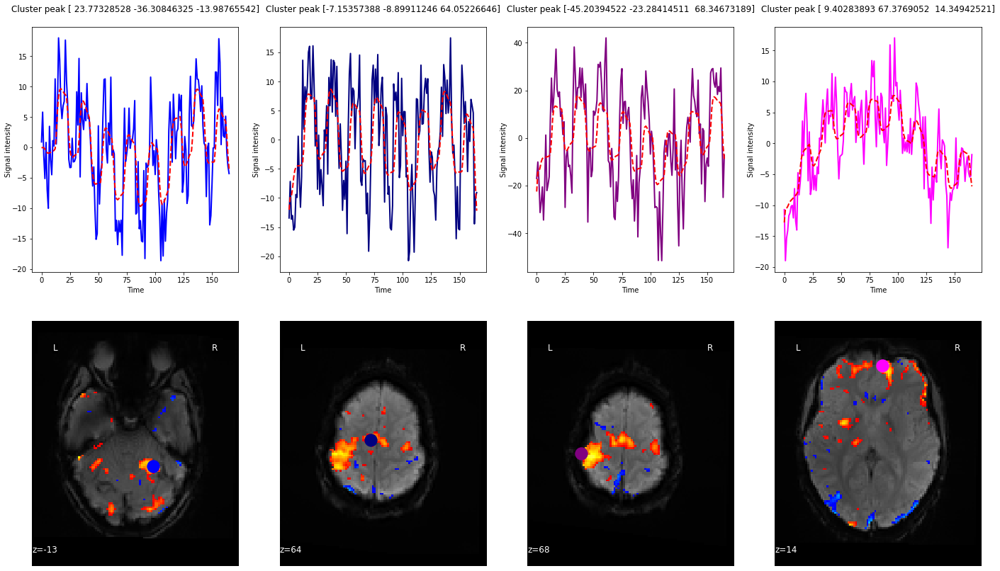

In [19]:
#data_folder = '/Users/juliagarciacornet/Desktop/Q4/Neuroimatge/project'
data_folder = 'C:/Users/vctrf/Documents/Quatrimestre_2/Neuroimagen/proyecto Neuroimagen'
fild_to_study='_task-motorloc_bold.nii.gz'
subject_code=[101,102,103,104,105,106,107,108,109,110]
#events_ = pd.read_table('/Users/juliagarciacornet/Desktop/Q4/Neuroimatge/project/task-motorloc_events.tsv')
events_ = pd.read_table('C:/Users/vctrf/Documents/Quatrimestre_2/Neuroimagen/proyecto Neuroimagen/task-motorloc_events.tsv')
events=events_.replace({'Task-ME':'Task-NF'})
Act_Rrest (data_folder,subject_code,events,fild_to_study)

# EEG

    onset  duration trial_type
0     2.0      20.0       Rest
1    22.0      20.0       Task
2    42.0      20.0       Rest
3    62.0      20.0       Task
4    82.0      20.0       Rest
5   102.0      20.0       Task
6   122.0      20.0       Rest
7   142.0      20.0       Task
8   162.0      20.0       Rest
9   182.0      20.0       Task
10  202.0      20.0       Rest
11  222.0      20.0       Task
12  242.0      20.0       Rest
13  262.0      20.0       Task
14  282.0      20.0       Rest
15  302.0      20.0       Task
16  322.0      20.0       Rest
17  342.0      20.0       Task
18  362.0      20.0       Rest
19  382.0      20.0       Task
20    NaN       NaN        NaN


/Users/juliagarciacornet/opt/anaconda3/envs/Neuroimatge/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:117: UserWarning: Duplicated events were detected. Amplitudes of these events will be summed. You might want to verify your inputs.
  warnings.warn("Duplicated events were detected. "
/Users/juliagarciacornet/opt/anaconda3/envs/Neuroimatge/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:117: UserWarning: Duplicated events were detected. Amplitudes of these events will be summed. You might want to verify your inputs.
  warnings.warn("Duplicated events were detected. "
/Users/juliagarciacornet/opt/anaconda3/envs/Neuroimatge/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:117: UserWarning: Duplicated events were detected. Amplitudes of these events will be summed. You might want to verify your inputs.
  warnings.warn("Duplicated events were detected. "
/Users/juliagarciacornet/opt/anaconda3/envs/Neuro

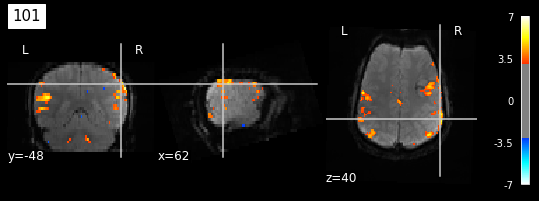

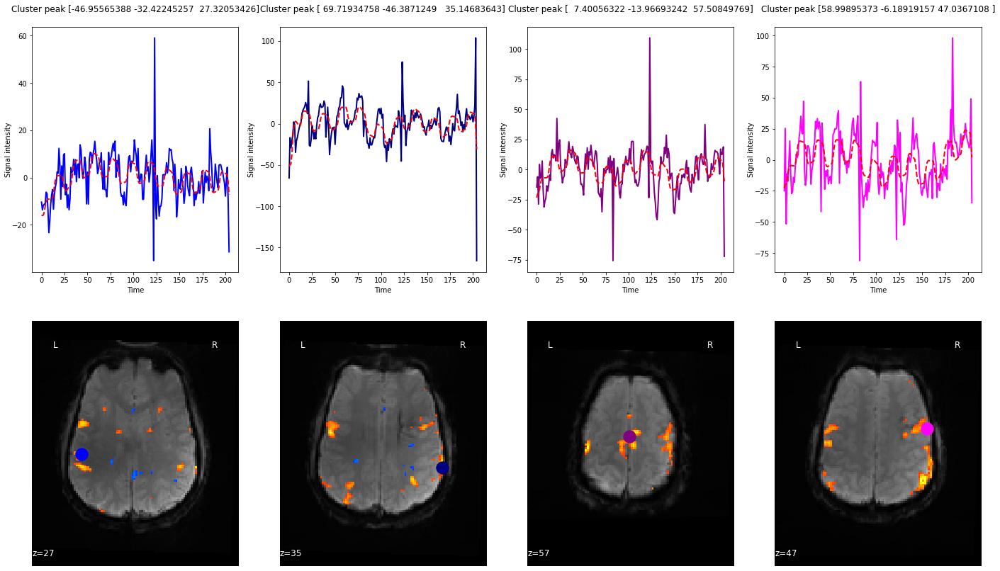

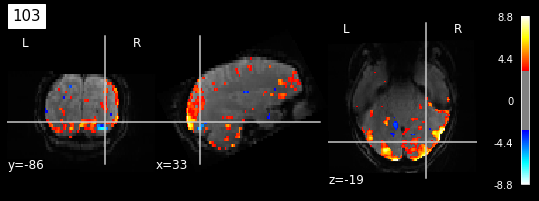

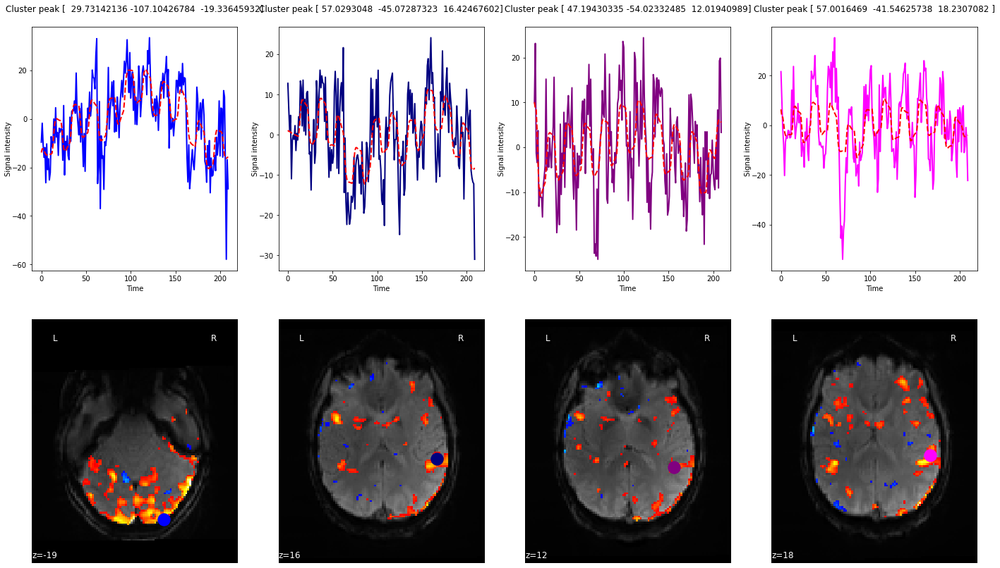

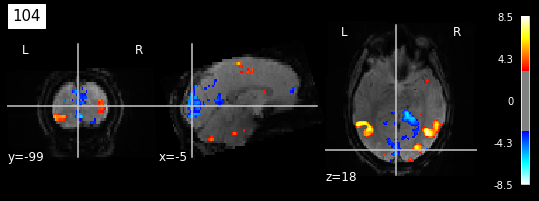

...

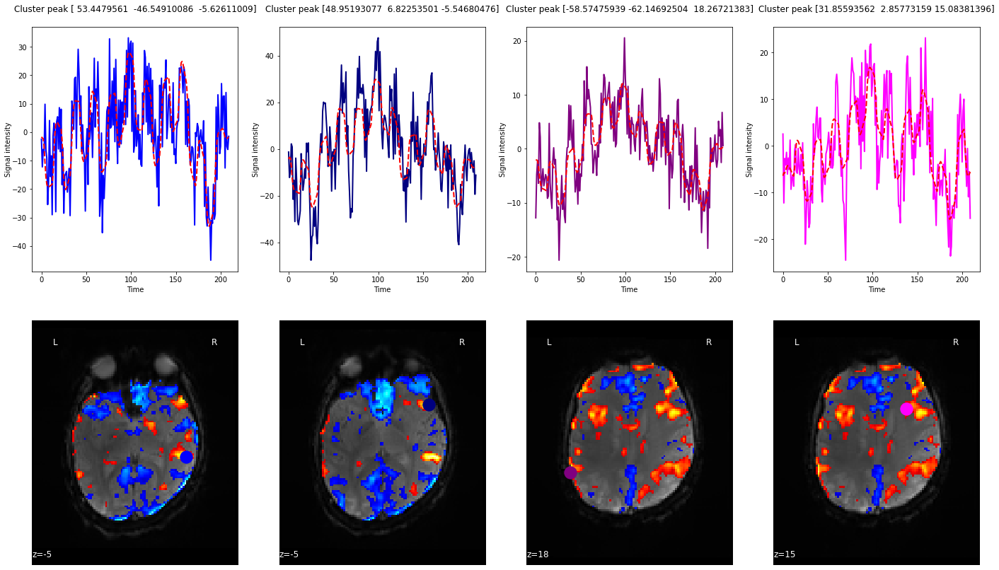

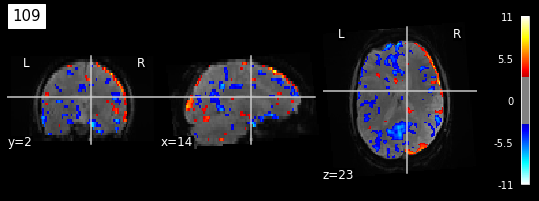

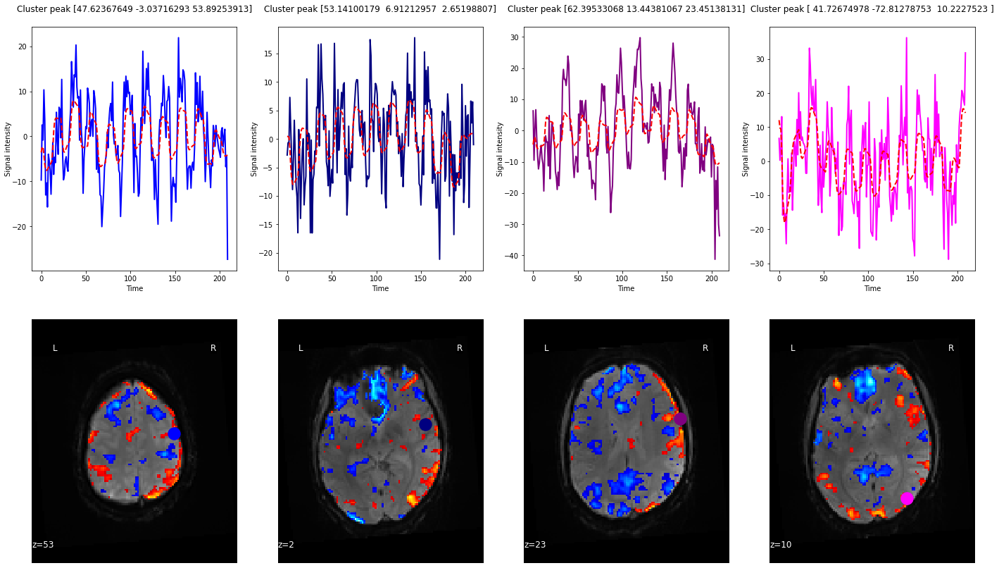

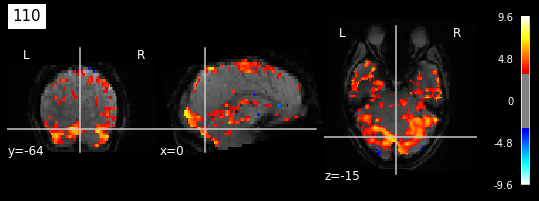

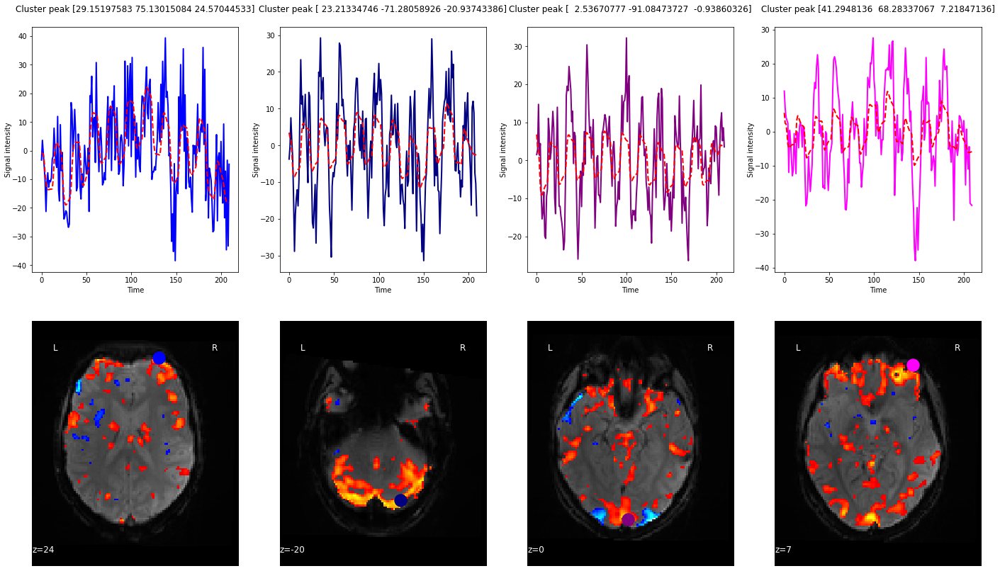

In [4]:
data_folder = '/Users/juliagarciacornet/Desktop/Q4/Neuroimatge/project'
#data_folder = 'C:/Users/vctrf/Documents/Quatrimestre_2/Neuroimagen/proyecto Neuroimagen'
fild_to_study='_task-eegNF_bold.nii.gz'
subject_code=[101,103,104,105,106,107,108,109,110]
events_ = pd.read_table('/Users/juliagarciacornet/Desktop/Q4/Neuroimatge/project/task-eegNF_events.tsv')
#events_ = pd.read_table('C:/Users/vctrf/Documents/Quatrimestre_2/Neuroimagen/proyecto Neuroimagen/task-fmriNF_events.tsv')

Act_Rrest (data_folder,subject_code,events_,fild_to_study)